# Prepare Clean (Glass + Gunshot) / 准备清理版（玻璃+枪声）

- 基于 `prepare.ipynb` 复制整理：去重 config/helper、按阶段分组，保持主逻辑不变。
- 下一步会逐步把关键步骤 API 化到 `src/`，供 infer 在线复用。


## Imports / 导入

In [1]:
import wave
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import librosa
import re
from IPython.display import Audio, display
from src.meta_utils import load_meta_files, map_canonical_labels, deduplicate_meta, sample_gunshot_even, stratified_folds
from src.viz import plot_wave_and_mel
from src.cache_utils import build_cache_index, GLASS_PIPELINE_PLAN
from src.datasets import balance_folds
from src.augment_pipeline import run_pipeline, PIPELINE_REGISTRY
from src.data_utils import load_audio, generate_aligned_windows, trim_silence, log_mel_spectrogram
from src.prepare_pipeline import cache_windows_to_mel_index, filter_and_sample_gunshot, load_and_split_meta
from src.config import TARGET_LABELS, POSITIVE_LABELS, SEED, SR, PROJECT_ROOT, N_MELS, HOP_LENGTH, BACKGROUND_LABEL, CACHE_ROOT, CACHE_MEL64, META_FILES, RAW_AUDIO_ROOTS, LABEL_TO_ID, NUM_CLASSES, MEL_CENTER, MEL_TARGET_FRAMES, WINDOW_PARAMS, DEVICE_PLANS
from src.augment_device import run_device_pipeline


## Config / 配置（集中）


In [2]:
# Config (single source of truth)
# Keep all run parameters here. 统一把本次运行参数放在这里。

META_FILES = META_FILES  # from config
LABEL_MAP = POSITIVE_LABELS
K_FOLDS = 5
TARGET_PER_FOLD = {'glass': 600, 'gunshot': 600}
TARGET_BG_PER_FOLD = 800

MAX_DURATION = 6.0  # seconds
GUNSHOT_TARGET = 360  # total gunshot clips after sampling
TARGET_SR = SR
RESAMPLED_ROOT = CACHE_ROOT / 'data_resampled'
INCLUDE_SOURCES = ['esc50', 'gunshot_kaggle', 'freesound_glass_extra']
TARGET_FRAMES = MEL_TARGET_FRAMES

# Windowing / energy thresholds (used by windowing + QA)
WINDOW_SECONDS = 1.0
WINDOW_HOP = 0.5
ENERGY_THRESHOLD = 0.3
PEAK_RATIO_THRESHOLD = 0.8
FRONT_PEAK_RATIO = 0.5
EXTRA_SHIFTS = (-0.1, 0.1)
TRIM_SILENCE_BEFORE = True
TRIM_TOP_DB = 20.0
TRIM_MIN_KEEP_SECONDS = 0.2
cfg_rows = [
    ('WINDOW_SECONDS', WINDOW_SECONDS, 'window length (s): longer=more context, shorter=less latency but may miss long events'),
    ('WINDOW_HOP', WINDOW_HOP, 'hop (s): smaller=denser windows, larger=fewer windows/less overlap'),
    ('ENERGY_THRESHOLD', ENERGY_THRESHOLD, 'energy mask threshold (relative): higher=drop quiet windows, lower=keep more'),
    ('PEAK_RATIO_THRESHOLD', PEAK_RATIO_THRESHOLD, 'peak energy ratio (relative to clip): higher=only strong peaks kept'),
    ('FRONT_PEAK_RATIO', FRONT_PEAK_RATIO, 'peak position limit (0-1): lower=peaks must be earlier'),
    ('EXTRA_SHIFTS', EXTRA_SHIFTS, 'fallback shifts (s) when no peak windows kept'),
    ('TRIM_SILENCE_BEFORE', TRIM_SILENCE_BEFORE, 'apply silence trim before windowing'),
    ('TRIM_TOP_DB', TRIM_TOP_DB, 'trim threshold dB: higher=more aggressive trimming'),
    ('TRIM_MIN_KEEP_SECONDS', TRIM_MIN_KEEP_SECONDS, 'min segment kept after trim (s)')
]
print('Windowing / energy config:')
for k,v,desc in cfg_rows:
    print(f'- {k}: {v} -> {desc}')


Windowing / energy config:
- WINDOW_SECONDS: 1.0 -> window length (s): longer=more context, shorter=less latency but may miss long events
- WINDOW_HOP: 0.5 -> hop (s): smaller=denser windows, larger=fewer windows/less overlap
- ENERGY_THRESHOLD: 0.3 -> energy mask threshold (relative): higher=drop quiet windows, lower=keep more
- PEAK_RATIO_THRESHOLD: 0.8 -> peak energy ratio (relative to clip): higher=only strong peaks kept
- FRONT_PEAK_RATIO: 0.5 -> peak position limit (0-1): lower=peaks must be earlier
- EXTRA_SHIFTS: (-0.1, 0.1) -> fallback shifts (s) when no peak windows kept
- TRIM_SILENCE_BEFORE: True -> apply silence trim before windowing
- TRIM_TOP_DB: 20.0 -> trim threshold dB: higher=more aggressive trimming
- TRIM_MIN_KEEP_SECONDS: 0.2 -> min segment kept after trim (s)


## Helpers / 辅助函数（集中）


In [3]:
# Helpers (shared across cells)
# 只放“纯 helper”，不依赖临时变量（例如 bg_pool/rng 这种仍留在原 cell 内）。

from typing import Any


def parse_weapon(extra: str) -> str:
    """Parse weapon_id=XXX from extra_meta string."""
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"


def _quantile95(x):
    return x.quantile(0.95)


def compute_energy_detail(sub_df: pd.DataFrame, sample_n: int = 80) -> pd.DataFrame:
    """Sample clips and compute duration/RMS peak/peak position/active ratio."""
    rows: list[dict[str, Any]] = []
    if len(sub_df) == 0:
        return pd.DataFrame(rows)
    sample = sub_df.sample(n=min(sample_n, len(sub_df)), random_state=SEED)
    for _, r in sample.iterrows():
        y, sr = load_audio(r, sr=TARGET_SR)
        if TRIM_SILENCE_BEFORE:
            y = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
        frame_length = min(2048, int(WINDOW_SECONDS * sr))
        hop = int(WINDOW_HOP * sr)
        rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop)[0]
        if rms.size == 0 or rms.max() <= 0:
            continue
        peak_idx = int(np.argmax(rms))
        peak_pos = peak_idx / max(len(rms) - 1, 1)
        active_ratio = float((rms > (rms.max() * ENERGY_THRESHOLD)).sum()) / len(rms)
        rows.append({
            'duration': len(y) / sr,
            'rms_max': float(rms.max()),
            'peak_pos': peak_pos,
            'active_ratio': active_ratio,
        })
    return pd.DataFrame(rows)


def resolve_audio_from_row(row: dict | pd.Series, sr: int = TARGET_SR):
    """Return (y, sr) using in-row audio if present, else load_audio(row)."""
    audio = None
    if isinstance(row, dict):
        audio = row.get('audio')
    else:
        audio = row.get('audio') if 'audio' in row else None
    if audio is not None:
        return audio, sr
    return load_audio(row, sr=sr)


## Load, map, dedup / 读取映射去重
- Load meta CSVs
- Map raw labels to canonical labels
- Deduplicate by md5/filepath
- Summary counts

读取 meta，映射标签，按 md5/路径去重，打印汇总。

In [4]:
meta_df, working_df, holdout_df = load_and_split_meta(
    META_FILES,
    label_map=LABEL_MAP,
    target_labels=TARGET_LABELS,
    include_sources=INCLUDE_SOURCES,
    dedup_subset=['md5', 'filepath'],
)
print('Total rows after dedup:', len(meta_df))
print('By source (all):', meta_df['source'].value_counts().to_dict(), '\n')
print('Working sources:', INCLUDE_SOURCES, '->', working_df['source'].value_counts().to_dict())
print('Working labels:', working_df['canonical_label'].value_counts().to_dict())
print('Holdout sources:', holdout_df['source'].value_counts().to_dict())
print('Holdout labels:', holdout_df['canonical_label'].value_counts().to_dict())


Total rows after dedup: 2882
By source (all): {'esc50': 2000, 'gunshot_kaggle': 851, 'freesound': 19, 'freesound_glass_extra': 12} 

Working sources: ['esc50', 'gunshot_kaggle', 'freesound_glass_extra'] -> {'esc50': 2000, 'gunshot_kaggle': 851, 'freesound_glass_extra': 12}
Working labels: {'gunshot': 851, 'glass': 52, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'hen': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'chirping_birds': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'train': 40, 'car_horn': 40, 'sheep': 40, 'water_drops': 40, 'church_

## Filter & gunshot sampling / 过滤与枪声抽样
- Drop clips longer than MAX_DURATION
- Evenly sample gunshot across weapon_id to total GUNSHOT_TARGET

过滤 >MAX_DURATION；枪声按 weapon_id 均匀抽样，总数 GUNSHOT_TARGET。

In [5]:
clean_df, gun_debug = filter_and_sample_gunshot(
    working_df,
    max_duration_sec=MAX_DURATION,
    gunshot_total=GUNSHOT_TARGET,
    seed=SEED,
)
if gun_debug.get('gunshot_sampled_rows', 0) > 0:
    print('Gunshot sampled per source:', gun_debug.get('gunshot_sampled_by_source', {}))
    print('Gunshot sampled per weapon_id (from parent folder):', gun_debug.get('gunshot_sampled_by_weapon_folder', {}), '\n')
print(f"Label counts: ({gun_debug.get('final_rows', len(clean_df))})", gun_debug.get('final_label_counts', {}))



Gunshot sampled per source: {'gunshot_kaggle': 360}
Gunshot sampled per weapon_id (from parent folder): {'AK-12': 40, 'AK-47': 40, 'IMI Desert Eagle': 40, 'M16': 40, 'M249': 40, 'M4': 40, 'MG-42': 40, 'MP5': 40, 'Zastava M92': 40} 

Label counts: (2369) {'gunshot': 360, 'glass': 49, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'hen': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'chirping_birds': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'train': 40, 'car_horn': 40, 'sheep': 40, 'water_drops': 40, 'church_bells': 40, 'clock_alarm': 40, 'keyb

## Resample to 22.05k mono / 重采样为22.05k单声道
Write resampled audio to cache/data_resampled and build resampled_df. 将重采样音频写到 cache/data_resampled，并生成 resampled_df。
⚠️ Loads & writes all clips; may take time/disk. 需加载并写出全部音频，耗时且占用磁盘。

In [6]:
resampled_rows = []
for _, r in clean_df.iterrows():
    y_rs, sr_rs = load_audio(r, sr=TARGET_SR)
    rel = Path(r['filepath'])
    if rel.is_absolute():
        rel = rel.relative_to(PROJECT_ROOT)
    dst_path = RESAMPLED_ROOT / rel
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    y_int16 = (y_rs * 32767).clip(-32768, 32767).astype('int16')
    with wave.open(dst_path.as_posix(), 'wb') as wf:
        wf.setnchannels(1)
        wf.setsampwidth(2)
        wf.setframerate(TARGET_SR)
        wf.writeframes(y_int16.tobytes())
    frames = len(y_int16)
    resampled_rows.append({
        'sno': r.get('sno', len(resampled_rows)+1),
        'raw_filepath': rel.as_posix(),
        'filepath': dst_path.relative_to(PROJECT_ROOT).as_posix(),
        'label': r.get('label'),
        'canonical_label': r.get('canonical_label'),
        'source': r.get('source'),
        'fold_id': r.get('fold_id',''),
        'duration_sec': round(frames / TARGET_SR, 3),
        'duration_samples': frames,
        'sr': TARGET_SR,
        'channels': 1,
        'bit_depth': 16,
        'md5': '',
        'extra_meta': r.get('extra_meta',''),
    })
resampled_df = pd.DataFrame(resampled_rows)
resampled_df['target_label'] = resampled_df['canonical_label']
print('Resampled rows:', len(resampled_df))
print('sr/ch after resample:', resampled_df['sr'].unique(), resampled_df['channels'].unique())
print('Label counts:', resampled_df['target_label'].value_counts().to_dict())


Resampled rows: 2369
sr/ch after resample: [21333] [1]
Label counts: {'gunshot': 360, 'glass': 49, 'snoring': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'hen': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'toilet_flush': 40, 'helicopter': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40, 'drinking_sipping': 40, 'dog': 40, 'chirping_birds': 40, 'pouring_water': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'train': 40, 'car_horn': 40, 'sheep': 40, 'water_drops': 40, 'church_bells': 40, 'clock_alarm': 40, 'keyboard_typing': 40, 'wind': 40, 'footsteps': 40, 'frog': 40, 'cow': 40, 'brushing_teeth': 40, 'crackling_fire': 40}


In [7]:
# Optional: save holdout meta for later use
if len(holdout_df) > 0:
    holdout_path = RESAMPLED_ROOT / 'holdout_meta.csv'
    holdout_path.parent.mkdir(parents=True, exist_ok=True)
    holdout_df.to_csv(holdout_path, index=False)
    print('Saved holdout meta to', holdout_path)


Saved holdout meta to /workspace/cache/data_resampled/holdout_meta.csv


## Listen: before vs after / 试听前后
Play original vs resampled audio for a few samples. 对比播放原始与重采样音频。

In [8]:
samples = resampled_df.sample(n=min(5, len(resampled_df)), random_state=SEED)
for _, r in samples.iterrows():
    y_after, sr_after = load_audio(r, sr=TARGET_SR)
    raw_rel = Path(r.get('raw_filepath', r['filepath']))
    raw_path = PROJECT_ROOT / raw_rel if not raw_rel.is_absolute() else raw_rel
    y_before, sr_before = (None, None)
    if raw_path.exists():
        y_before, sr_before = load_audio({'filepath': raw_path}, sr=None)
    print('Sample:', r.get('target_label',''), '|', raw_rel)
    if y_before is not None:
        display(Audio(y_before, rate=sr_before))
    display(Audio(y_after, rate=sr_after))
    print('-'*40)


Sample: mouse_click | data/esc50/audio/3-167096-A-31.wav


----------------------------------------
Sample: breathing | data/esc50/audio/1-36402-A-23.wav


----------------------------------------
Sample: dog | data/esc50/audio/5-212454-A-0.wav


----------------------------------------
Sample: chirping_birds | data/esc50/audio/2-72547-D-14.wav


----------------------------------------
Sample: water_drops | data/esc50/audio/2-64963-A-15.wav


----------------------------------------


## 给 Audio 进行分折
- 在audio层进行分折，可以避免同一个audio切窗之后混入不同的 fold


In [9]:
folded_df = stratified_folds(resampled_df, k=K_FOLDS, seed=SEED, group_key='canonical_label', sub_key='weapon_id', fold_column='fold_id')
print('Fold distribution (counts):', folded_df['fold_id'].value_counts().to_dict())
fold_pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
print('Label x fold (counts):')
display(fold_pivot)

# 从 extra_meta 中提取 weapon_id=XXXX 的值
gun_df = folded_df[folded_df['canonical_label'] == 'gunshot'].copy()
gun_df["weapon"] = gun_df["extra_meta"].apply(parse_weapon)
weapon_fold = gun_df.pivot_table(
    index="weapon",
    columns="fold_id",
    values="filepath",
    aggfunc="count",
    fill_value=0
).astype(int)
print("\nWeapon x fold (counts):")
display(weapon_fold)


Fold distribution (counts): {1: 474, 2: 474, 3: 474, 4: 474, 5: 473}
Label x fold (counts):


fold_id,1,2,3,4,5
target_label,,,,,
airplane,8,8,8,8,8
breathing,8,8,8,8,8
brushing_teeth,8,8,8,8,8
can_opening,8,8,8,8,8
car_horn,8,8,8,8,8
cat,8,8,8,8,8
chainsaw,8,8,8,8,8
chirping_birds,8,8,8,8,8
church_bells,8,8,8,8,8



Weapon x fold (counts):


fold_id,1,2,3,4,5
weapon,,,,,
AK-12,8,8,8,8,8
AK-47,8,8,8,8,8
IMI Desert Eagle,8,8,8,8,8
M16,8,8,8,8,8
M249,8,8,8,8,8
M4,8,8,8,8,8
MG-42,8,8,8,8,8
MP5,8,8,8,8,8
Zastava M92,8,8,8,8,8


### Detailed energy/peak stats / 能量与峰值细查 (统计峰值位置、活跃占比，辅助判断窗口/裁剪参数)。

Energy detail (mean/median/95%)


duration                         rms_max                        \
             mean    median _quantile95      mean    median _quantile95   
label                                                                     
glass    1.165395  0.648010     4.35679  0.204339  0.179578    0.696223   
gunshot  1.419407  1.464023     2.00000  0.211868  0.205025    0.358226   

         peak_pos                    active_ratio                     
             mean median _quantile95         mean median _quantile95  
label                                                                 
glass    0.223129    0.0         1.0     0.828792    1.0         1.0  
gunshot  0.518750    0.5         1.0     0.838333    1.0         1.0

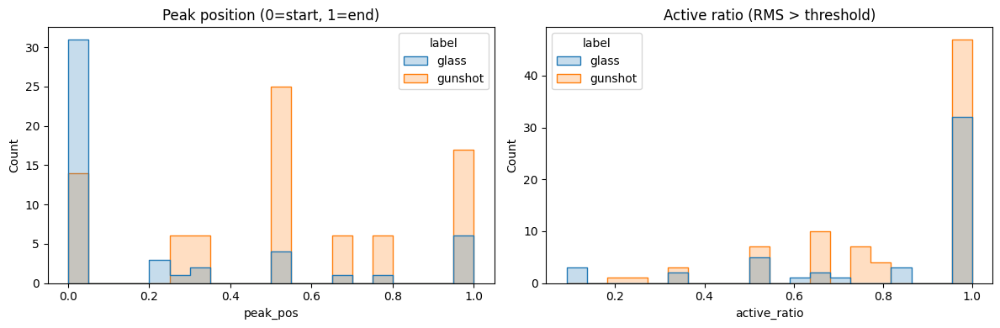

In [10]:
# Detailed energy/peak stats (uses global config values)

energy_detail = []
for lbl in ['glass', 'gunshot']:
    df_lbl = folded_df[folded_df['target_label'] == lbl]
    stats = compute_energy_detail(df_lbl)
    stats['label'] = lbl
    energy_detail.append(stats)
energy_detail = pd.concat(energy_detail, ignore_index=True)
print('Energy detail (mean/median/95%)')
display(energy_detail.groupby('label')[['duration', 'rms_max', 'peak_pos', 'active_ratio']].agg(['mean', 'median', _quantile95]))

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.histplot(data=energy_detail, x='peak_pos', hue='label', bins=20, ax=axes[0], element='step')
axes[0].set_title('Peak position (0=start, 1=end)')
sns.histplot(data=energy_detail, x='active_ratio', hue='label', bins=20, ax=axes[1], element='step')
axes[1].set_title('Active ratio (RMS > threshold)')
plt.tight_layout(); plt.show()


## Base window summary / 基础分窗统计
Generate aligned windows for glass & gunshot, count per clip. 对玻璃/枪声分窗，统计每clip窗口数。

In [11]:
records = []
labels_for_align = ['glass', 'gunshot']
all_labels = sorted(folded_df['target_label'].unique().tolist())
subset = folded_df[folded_df['target_label'].isin(all_labels)]
for _, row in subset.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=labels_for_align,
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    records.append({
        'label': row['target_label'],
        'fold': row.get('fold_id', -1),
        'clip': Path(row['filepath']).stem,
        'n_windows': len(wins),
    })
base_df = pd.DataFrame(records)

# 简单键值统计：每类多少个窗口
if base_df.empty:
    print('No windows found')
else:
    total_windows = int(base_df['n_windows'].sum())
    print(f"Total clips: {len(base_df)}, total windows: {total_windows}")
    label_windows = base_df.groupby('label')['n_windows'].sum().reindex(all_labels, fill_value=0)
    print("\nWindows per label:")
    for lbl, cnt in label_windows.to_dict().items():
        print(f"  {lbl}: {int(cnt)}")

    if 'fold' in base_df.columns:
        fold_totals = base_df.pivot_table(index='fold', columns='label', values='n_windows', aggfunc='sum').fillna(0)
        print("\nWindows per fold x label (total windows):")
        display(fold_totals.T)


Total clips: 2369, total windows: 10306

Windows per label:
  airplane: 310
  breathing: 136
  brushing_teeth: 266
  can_opening: 49
  car_horn: 177
  cat: 109
  chainsaw: 258
  chirping_birds: 225
  church_bells: 301
  clapping: 256
  clock_alarm: 262
  clock_tick: 155
  coughing: 63
  cow: 155
  crackling_fire: 252
  crickets: 315
  crow: 218
  crying_baby: 135
  dog: 86
  door_wood_creaks: 157
  door_wood_knock: 75
  drinking_sipping: 86
  engine: 321
  fireworks: 97
  footsteps: 168
  frog: 196
  glass: 67
  gunshot: 609
  hand_saw: 215
  helicopter: 327
  hen: 134
  insects: 227
  keyboard_typing: 178
  laughing: 139
  mouse_click: 126
  pig: 150
  pouring_water: 166
  rain: 347
  rooster: 73
  sea_waves: 285
  sheep: 202
  siren: 294
  sneezing: 43
  snoring: 109
  thunderstorm: 165
  toilet_flush: 213
  train: 320
  vacuum_cleaner: 331
  washing_machine: 339
  water_drops: 91
  wind: 328

Windows per fold x label (total windows):


label,airplane,breathing,brushing_teeth,can_opening,car_horn,cat,chainsaw,chirping_birds,church_bells,clapping,...,siren,sneezing,snoring,thunderstorm,toilet_flush,train,vacuum_cleaner,washing_machine,water_drops,wind
fold,,,,,,,,,,,,,,,,,,,,,
1,60,26,64,9,23,29,61,44,58,61,...,58,8,21,24,43,67,63,70,19,62
2,69,29,49,12,36,20,50,42,65,43,...,63,8,22,46,38,67,66,66,25,55
3,61,24,47,8,39,14,39,56,53,64,...,51,10,30,31,45,60,71,72,22,71
4,61,31,52,9,31,23,57,43,65,35,...,67,8,20,31,43,60,61,67,15,70
5,59,26,54,11,48,23,51,40,60,53,...,55,9,16,33,44,66,70,64,10,70


## Window QA visualization / 分窗可视化QA
Plot waveform+RMS with kept window boundaries for one glass and one gunshot sample. 对玻璃/枪声各选一条，画波形+RMS并标出保留的窗口边界。



=== Sample 1: glass | esc50 | cache/data_resampled/data/esc50/audio/3-203371-A-39.wav
Full clip (5.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,NaN,NaN,info,len_raw=5.000s len_trim=1.008s lead_trim=0.000...
1,1.008016,5.0,NaN,NaN,remove,silent_trim_tail
2,0.000000,1.0,1.0,0.029579,keep,pass


Length raw=5.00s after_trim=1.01s


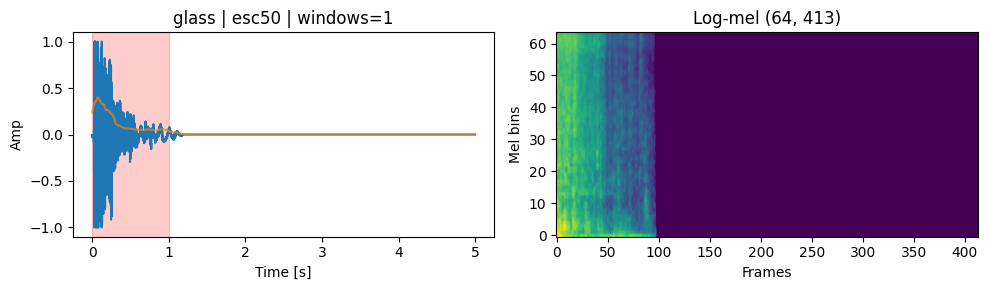

Play window 0: 0.00s - 1.00s



=== Sample 2: gunshot | gunshot_kaggle | cache/data_resampled/data/gunshot_kaggle/AK-47/1 (54).wav
Full clip (2.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,NaN,NaN,info,len_raw=2.000s len_trim=2.000s lead_trim=0.000...
1,0.000000,1.000000,1.000000,0.404256,keep,pass
2,0.499977,1.499977,0.960047,0.337552,keep,pass
3,0.999953,1.999953,0.854799,0.712324,keep,late_peak_keep_front_energy


Length raw=2.00s after_trim=2.00s


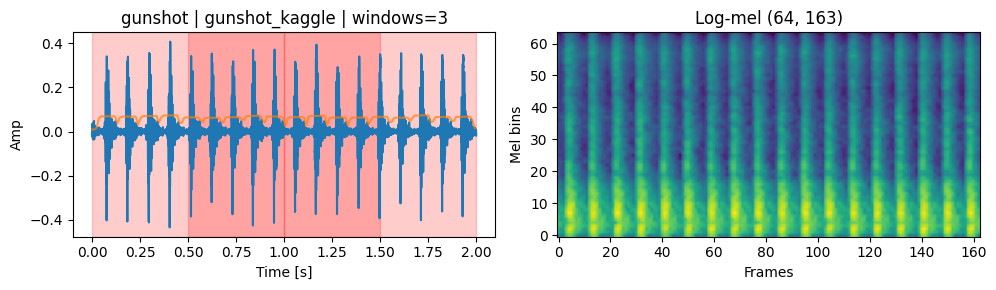

Play window 0: 0.00s - 1.00s


Play window 1: 0.50s - 1.50s


Play window 2: 1.00s - 2.00s



=== Sample 3: laughing | esc50 | cache/data_resampled/data/esc50/audio/2-79775-A-26.wav
Full clip (5.00s)


,start_sec,end_sec,peak_ratio,peak_position,status,reason
0,NaN,NaN,None,None,info,len_raw=5.000s len_trim=5.000s lead_trim=0.000...
1,0.000000,1.000000,None,None,skip,mask_below_threshold
2,0.499977,1.499977,None,None,keep,pass
3,0.999953,1.999953,None,None,keep,pass
4,1.499930,2.499930,None,None,skip,mask_below_threshold
5,1.999906,2.999906,None,None,skip,mask_below_threshold
6,2.499883,3.499883,None,None,skip,mask_below_threshold
7,2.999859,3.999859,None,None,skip,mask_below_threshold
8,3.499836,4.499836,None,None,skip,mask_below_threshold
9,3.999812,4.999812,None,None,skip,mask_below_threshold


Length raw=5.00s after_trim=5.00s


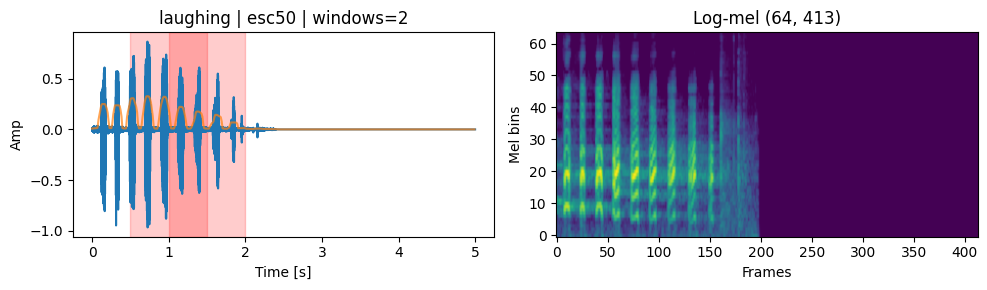

Play window 0: 0.50s - 1.50s


Play window 1: 1.00s - 2.00s


In [12]:
qa_seed = 7


## Window QA (combined viz + listening) / 分窗 QA（可视化+试听）
# Sample one glass, one gunshot, one background (if available); visualize windows and listen to kept windows.
samples_cfg = ['glass','gunshot', BACKGROUND_LABEL]
samples = []
for lbl in samples_cfg:
    subset = folded_df[folded_df['target_label']==lbl]
    if len(subset) == 0:
        continue
    samples.append(subset.sample(random_state=qa_seed).iloc[0])
if not any(s.get('target_label') == BACKGROUND_LABEL for s in samples):
    bg_pool = folded_df[~folded_df['target_label'].isin(['glass','gunshot'])]
    if len(bg_pool) > 0:
        samples.append(bg_pool.sample(random_state=qa_seed).iloc[0])
if len(samples) == 0:
    print('No samples available for QA')
else:
    for idx, row in enumerate(samples):
        print(f"\n=== Sample {idx+1}: {row.get('target_label','')} | {row.get('source','')} | {row.get('filepath','')}")
        y, sr = load_audio(row, sr=TARGET_SR)
        print(f"Full clip ({len(y)/sr:.2f}s)")
        display(Audio(y, rate=sr))
        # 记录窗口决策日志
        logs = []
        wins = generate_aligned_windows(
            row,
            align_labels=['glass','gunshot'],
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
            debug=True,
            debug_sink=logs,
        )
        # 打印日志表，便于查看被丢弃原因
        if logs:
            import pandas as pd
            display(pd.DataFrame(logs))
        # 记录修剪前后长度
        if TRIM_SILENCE_BEFORE:
            y_trim = trim_silence(y, sr, top_db=TRIM_TOP_DB, min_keep_seconds=TRIM_MIN_KEEP_SECONDS)
            print(f"Length raw={len(y)/sr:.2f}s after_trim={len(y_trim)/sr:.2f}s")
        hop_len = int(WINDOW_HOP * sr)
        win_len = int(WINDOW_SECONDS * sr)
        fig, axes = plt.subplots(1, 2, figsize=(10, 3))
        times = np.arange(len(y)) / sr
        axes[0].plot(times, y)
        axes[0].set_title(f"{row['target_label']} | {row['source']} | windows={len(wins)}")
        axes[0].set_xlabel('Time [s]')
        axes[0].set_ylabel('Amp')
        rms = librosa.feature.rms(y=y, frame_length=2048, hop_length=256)[0]
        rms_times = (np.arange(len(rms)) * 256) / sr
        axes[0].plot(rms_times, rms, alpha=0.7)
        # 使用日志中的 start_sec 标记被保留的窗口
        kept_starts = [l['start_sec'] for l in logs if l.get('status') == 'keep' and l.get('start_sec') is not None]
        for start_sec in kept_starts:
            axes[0].axvspan(start_sec, start_sec + WINDOW_SECONDS, color='red', alpha=0.2)
        mel = log_mel_spectrogram(y, sr, n_fft=HOP_LENGTH*4, hop_length=HOP_LENGTH, n_mels=N_MELS)
        axes[1].imshow(mel, aspect='auto', origin='lower')
        axes[1].set_title(f'Log-mel {mel.shape}')
        axes[1].set_xlabel('Frames')
        axes[1].set_ylabel('Mel bins')
        plt.tight_layout(); plt.show()
        for w_idx, w in enumerate(wins):
            start = kept_starts[w_idx] if w_idx < len(kept_starts) else w_idx * hop_len / sr
            end = start + WINDOW_SECONDS
            print(f"Play window {w_idx}: {start:.2f}s - {end:.2f}s")
            display(Audio(w, rate=sr))


## Play 10 event windows / 播放10个事件窗口
Play up to 10 kept windows (glass/gunshot) for quick QA. 播放最多10个保留窗口，便于快速听检。


In [13]:
clips = folded_df[folded_df['target_label'].isin(['glass','gunshot'])].sample(frac=1.0, random_state=SEED)
played = 0
for _, row in clips.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=['glass','gunshot'],
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    for w_idx, w in enumerate(wins):
        print('{} | {} | window {}'.format(row['target_label'], Path(row['filepath']).stem, w_idx))
        display(Audio(w, rate=TARGET_SR))
        played += 1
        if played >= 10:
            break
    if played >= 10:
        break
if played == 0:
    print('No windows to play')

if not wins:
    print('No windows to inspect for shape')
else:
    mel = log_mel_spectrogram(wins[0], sr=TARGET_SR)
    print(f'log-mel shape: {mel.shape}; model input: (batch, 1, {mel.shape[0]}, {mel.shape[1]})')


gunshot | 5 (49) | window 0


gunshot | 5 (49) | window 1


gunshot | 2 (75) | window 0


gunshot | 1 (12) | window 0


gunshot | 1 (35) | window 0


gunshot | 1 (35) | window 1


gunshot | 3 (26) | window 0


gunshot | 3 (26) | window 1


glass | 4-204777-A-39 | window 0


glass | 4-204777-A-39 | window 1


log-mel shape: (64, 80); model input: (batch, 1, 64, 80)


## 整合原始window数据

In [14]:
# Build window-level dataframe (one row per window)
window_records = []
labels_for_align = TARGET_LABELS  # 正类对齐峰值，其余走背景逻辑
for _, row in folded_df.iterrows():
    wins = generate_aligned_windows(
        row,
        align_labels=labels_for_align,
        extra_shifts=EXTRA_SHIFTS,
        energy_threshold=ENERGY_THRESHOLD,
        peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
        front_peak_ratio=FRONT_PEAK_RATIO,
        trim_silence_before=TRIM_SILENCE_BEFORE,
        trim_top_db=TRIM_TOP_DB,
        trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
        label_params=WINDOW_PARAMS,
    )
    base_label = row.get('canonical_label', row.get('target_label', 'unknown'))
    mapped_label = base_label if base_label in TARGET_LABELS else BACKGROUND_LABEL
    clip_id = Path(row['filepath']).stem
    for w_idx, w in enumerate(wins):
        start_sec = w_idx * WINDOW_HOP
        end_sec = start_sec + WINDOW_SECONDS
        window_records.append({
            'clip_id': clip_id,
            'window_id': f"w{w_idx}",
            'fold_id': row.get('fold_id', -1),
            'source': row.get('source', ''),
            'orig_label': base_label,
            'target_label': mapped_label,
            'start_sec': start_sec,
            'end_sec': end_sec,
            'length_sec': WINDOW_SECONDS,
            'filepath': row.get('filepath'),
            'raw_filepath': row.get('raw_filepath'),
        })

window_df = pd.DataFrame(window_records)
print(f"Total windows: {len(window_df)}")
label_totals = window_df['target_label'].value_counts().to_dict()
print("Windows per label (total):")
for k, v in label_totals.items():
    print(f"  {k}: {v}")

if 'fold_id' in window_df.columns:
    print("\nFold x label (total windows):")
    pivot = window_df.pivot_table(index='fold_id', columns='target_label', values='window_id', aggfunc='count').fillna(0)
    print(pivot.to_string())


display(window_df[:5])


Total windows: 10306
Windows per label (total):
  background: 9630
  gunshot: 609
  glass: 67

Fold x label (total windows):
target_label  background  glass  gunshot
fold_id                                 
1                   1928     14      119
2                   1903     10      123
3                   1947     10      122
4                   1930     22      119
5                   1922     11      126


,clip_id,window_id,fold_id,source,orig_label,target_label,start_sec,end_sec,length_sec,filepath,raw_filepath
0,5-215445-A-47,w0,1,esc50,airplane,background,0.0,1.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
1,5-215445-A-47,w1,1,esc50,airplane,background,0.5,1.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
2,5-215445-A-47,w2,1,esc50,airplane,background,1.0,2.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
3,5-215445-A-47,w3,1,esc50,airplane,background,1.5,2.5,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav
4,5-215445-A-47,w4,1,esc50,airplane,background,2.0,3.0,1.0,cache/data_resampled/data/esc50/audio/5-215445...,data/esc50/audio/5-215445-A-47.wav


## Augment plan & cache dirs / 增强计划与缓存目录
设定 pipeline、对齐标签、Smoke/Full 输出目录。

In [15]:
# ALIGN_LABELS = CACHE_ALIGN_LABELS
SMOKE_CACHE_DIR = CACHE_MEL64 / 'mel64_smoke_multi'
FULL_CACHE_DIR = CACHE_MEL64 / 'mel64_multi'
SMOKE_COUNTS = {'glass': 10, 'gunshot': 10, 'background': 20}
print('Smoke dir:', SMOKE_CACHE_DIR)
print('Full dir:', FULL_CACHE_DIR)


Smoke dir: /workspace/cache/mel64/mel64_smoke_multi
Full dir: /workspace/cache/mel64/mel64_multi


## 选出 target window，并使用数据增强扩充

In [16]:
import re

PIPELINE_PLAN_GLASS = list(PIPELINE_REGISTRY.keys())
PIPELINE_PLAN_GUNSHOT = [
    k for k in PIPELINE_REGISTRY.keys()
    if k not in ["reverb_mix_filter_gain", "stretch_mix_filter_gain", "reverb_filter_gain"]  # 可按需调整
]

rng = np.random.default_rng(SEED)
aug_records = []

def parse_weapon(extra: str):
    if not isinstance(extra, str):
        return "unknown"
    m = re.search(r"weapon_id=([^,;]+)", extra)
    return m.group(1).strip() if m else "unknown"

# 如果已有 bg_pool / TARGET_SR
def sample_bg_chunk(length):
    if bg_pool.empty:
        return None
    row_bg = bg_pool.sample(random_state=SEED).iloc[0]
    y_bg, _ = load_audio(row_bg, sr=TARGET_SR)
    if len(y_bg) < length:
        y_bg = np.pad(y_bg, (0, length - len(y_bg)))
    start = rng.integers(0, max(1, len(y_bg) - length + 1))
    return y_bg[start:start+length]
    

In [17]:
tasks_pos = []  # 每个元素保存本折本类的 win_pool、剩余额度等

for lab, target in TARGET_PER_FOLD.items():
    for fold, group in folded_df[folded_df["canonical_label"] == lab].groupby("fold_id"):
        win_pool = []
        for _, row in group.iterrows():
            wins = generate_aligned_windows(
                row,
                align_labels=TARGET_LABELS,
                extra_shifts=EXTRA_SHIFTS,
                energy_threshold=ENERGY_THRESHOLD,
                peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
                front_peak_ratio=FRONT_PEAK_RATIO,
                trim_silence_before=TRIM_SILENCE_BEFORE,
                trim_top_db=TRIM_TOP_DB,
                trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
                label_params=WINDOW_PARAMS,
            )
            clip_id = Path(row["filepath"]).stem
            weapon = parse_weapon(row.get("extra_meta", "")) if lab == "gunshot" else None
            for w_idx, w in enumerate(wins):
                win_pool.append((clip_id, w_idx, w, row, weapon))

        if not win_pool:
            continue

        # base 全写，不占配额
        for clip_id, w_idx, w, row, _weapon in win_pool:
            aug_records.append({
                "clip_id": clip_id,
                "window_id": f"{clip_id}_w{w_idx}",
                "fold_id": fold,
                "source": row.get("source",""),
                "original_label": lab,
                "target_label": lab,
                "pipeline": "base",
                "copy": 0,
                "length_sec": len(w) / TARGET_SR,
                "audio": w,
            })

        remaining = max(target - len(win_pool), 0)
        plan_names = PIPELINE_PLAN_GUNSHOT if lab == "gunshot" else PIPELINE_PLAN_GLASS
        tasks_pos.append({
            "lab": lab,
            "fold": fold,
            "win_pool": win_pool,
            "remaining": remaining,
            "plan_names": plan_names,
        })

# 查看 tasks_pos 摘要
summary = []
for t in tasks_pos:
    summary.append({
        "lab": t["lab"],
        "fold": t["fold"],
        "win_pool": len(t["win_pool"]),
        "remaining": t["remaining"],
        "plan_names": t["plan_names"],
        "device_plans": DEVICE_PLANS,
    })

with pd.option_context("display.max_colwidth", None):
    display(pd.DataFrame(summary))


,lab,fold,win_pool,remaining,plan_names,device_plans
0,glass,1,14,586,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
1,glass,2,10,590,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
2,glass,3,10,590,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
3,glass,4,22,578,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
4,glass,5,11,589,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
5,gunshot,1,119,481,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
6,gunshot,2,123,477,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
7,gunshot,3,122,478,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
8,gunshot,4,119,481,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"
9,gunshot,5,126,474,"[stretch_gain_shift, reverb_gain_shift, mix_gain_shift, filter_gain_shift, mix_filter_gain_shift, stretch_mix_gain_shift, stretch_filter_gain_shift, reverb_mix_gain_shift, reverb_filter_gain_shift, stretch_mix_filter_gain_shift, reverb_mix_filter_gain_shift]","[none, eq, band, rir, codec, compress, codec_compress]"


In [18]:
# Cell C: positives with device sim + event augment (含 base & 进度)
aug_records = []

PROGRESS_STEP = 200  # 每处理多少条打印一次


for task in tasks_pos:
    lab = task["lab"]; fold = task["fold"]; win_pool = task["win_pool"]
    remaining = task["remaining"]; plan_names = task["plan_names"]
    if not win_pool:
        print(f"[warn] fold {fold} lab {lab} win_pool empty, skip.")
        continue

    # 1) 先写入 base（不占 remaining），device=none
    for clip_id, w_idx, w, row, _weapon in win_pool:
        aug_records.append({
            "clip_id": clip_id,
            "window_id": f"{clip_id}_w{w_idx}",
            "fold_id": fold,
            "source": row.get("source",""),
            "original_label": lab,
            "target_label": lab,
            "pipeline": "base",
            "device": "none",
            "copy": 0,
            "length_sec": len(w) / TARGET_SR,
            "audio": w,
        })

    if remaining <= 0 or not plan_names:
        print(f"[info] fold {fold} lab {lab}: remaining=0 or no plan, only base written.")
        continue

    device_idx = 0  # 轮询设备计划

    if lab == "gunshot":
        win_by_weapon = {}
        for item in win_pool:
            weapon = item[4] or "unknown"
            win_by_weapon.setdefault(weapon, []).append(item)
        for w in win_by_weapon:
            rng.shuffle(win_by_weapon[w])
        weapons = sorted(win_by_weapon.keys())
        base_by_weapon = {w: lst.copy() for w, lst in win_by_weapon.items()}
        base_global = win_pool.copy()

        count = 0; plan_idx = 0
        while count < remaining:
            progressed = False
            evt_name = plan_names[plan_idx % len(plan_names)]; plan_idx += 1
            for weapon in weapons:
                if count >= remaining:
                    break
                pool = win_by_weapon.get(weapon, [])
                if pool:
                    item = pool.pop(0)
                else:
                    if base_by_weapon.get(weapon):
                        idx = rng.integers(0, len(base_by_weapon[weapon]))
                        item = base_by_weapon[weapon][idx]
                    elif base_global:
                        idx = rng.integers(0, len(base_global))
                        item = base_global[idx]
                    else:
                        continue
                clip_id, w_idx, w, row, _weapon = item

                # 设备扰动（y, name, sr）
                device_name = DEVICE_PLANS[device_idx % len(DEVICE_PLANS)]; device_idx += 1
                w_dev = run_device_pipeline(w, device_name, TARGET_SR)

                # 事件增广
                bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[evt_name] else None
                aug = run_pipeline(w_dev, evt_name, background=bg)

                pipeline_tag = evt_name if device_name == "none" else f"{device_name}+{evt_name}"
                aug_records.append({
                    "clip_id": clip_id,
                    "window_id": f"{clip_id}_w{w_idx}",
                    "fold_id": fold,
                    "source": row.get("source",""),
                    "original_label": lab,
                    "target_label": lab,
                    "pipeline": pipeline_tag,
                    "device": device_name,
                    "copy": 0,
                    "length_sec": len(aug.audio) / TARGET_SR,
                    "audio": aug.audio,
                })
                count += 1; progressed = True
                if count % PROGRESS_STEP == 0:
                    print(f"[progress] fold {fold} lab {lab} count={count}/{remaining}")
            if not progressed:
                break

    else:
        rng.shuffle(win_pool)
        count = 0; pool_idx = 0
        while count < remaining:
            item = win_pool[pool_idx % len(win_pool)]; pool_idx += 1
            clip_id, w_idx, w, row, _weapon = item
            evt_name = plan_names[count % len(plan_names)] if count < len(plan_names) else rng.choice(plan_names)

            device_name = DEVICE_PLANS[device_idx % len(DEVICE_PLANS)]; device_idx += 1
            w_dev = run_device_pipeline(w, device_name, TARGET_SR)

            bg = sample_bg_chunk(len(w_dev)) if "mix" in PIPELINE_REGISTRY[evt_name] else None
            aug = run_pipeline(w_dev, evt_name, background=bg)

            pipeline_tag = evt_name if device_name == "none" else f"{device_name}+{evt_name}"
            aug_records.append({
                "clip_id": clip_id,
                "window_id": f"{clip_id}_w{w_idx}",
                "fold_id": fold,
                "source": row.get("source",""),
                "original_label": lab,
                "target_label": lab,
                "pipeline": pipeline_tag,
                "device": device_name,
                "copy": 0,
                "length_sec": len(aug.audio) / TARGET_SR,
                "audio": aug.audio,
            })
            count += 1
            if count % PROGRESS_STEP == 0:
                print(f"[progress] fold {fold} lab {lab} count={count}/{remaining}")

    print(f"[done] fold {fold} lab {lab}: base={len(win_pool)}, aug_added={remaining}")

aug_df = pd.DataFrame(aug_records)
display(aug_df[:5])

print("\nWindows per fold x target_label x pipeline (with totals):")
pivot = aug_df.pivot_table(
    index="fold_id",
    columns=["target_label", "pipeline"],
    values="window_id",
    aggfunc="count"
).fillna(0).astype(int)
pivot["total"] = pivot.sum(axis=1)
total_row = pivot.sum(axis=0).to_frame().T; total_row.index = ["total"]
pivot_with_totals = pd.concat([pivot, total_row])
print(pivot_with_totals.T.to_string())

# weapon 映射与统计
weapon_map = {
    Path(row["filepath"]).stem: parse_weapon(row.get("extra_meta", ""))
    for _, row in folded_df[folded_df["canonical_label"] == "gunshot"].iterrows()
}
aug_df["weapon"] = aug_df.apply(
    lambda r: weapon_map.get(r["clip_id"], "unknown") if r["target_label"] == "gunshot" else None,
    axis=1,
)
gun_aug = aug_df[aug_df["target_label"] == "gunshot"].copy()
print("\nWeapon x fold (augmented windows, counts):")
weapon_fold_win = gun_aug.pivot_table(
    index="weapon",
    columns="fold_id",
    values="window_id",
    aggfunc="count",
    fill_value=0
).astype(int)
display(weapon_fold_win)

print("\nDevice x fold (positives, counts):")
pivot_dev = aug_df.pivot_table(
    index="device",
    columns="fold_id",
    values="window_id",
    aggfunc="count",
    fill_value=0
).astype(int)
display(pivot_dev)


[progress] fold 1 lab glass count=200/586
[progress] fold 1 lab glass count=400/586
[done] fold 1 lab glass: base=14, aug_added=586
[progress] fold 2 lab glass count=200/590
[progress] fold 2 lab glass count=400/590
[done] fold 2 lab glass: base=10, aug_added=590
[progress] fold 3 lab glass count=200/590
[progress] fold 3 lab glass count=400/590
[done] fold 3 lab glass: base=10, aug_added=590
[progress] fold 4 lab glass count=200/578
[progress] fold 4 lab glass count=400/578
[done] fold 4 lab glass: base=22, aug_added=578
[progress] fold 5 lab glass count=200/589
[progress] fold 5 lab glass count=400/589
[done] fold 5 lab glass: base=11, aug_added=589
[progress] fold 1 lab gunshot count=200/481
[progress] fold 1 lab gunshot count=400/481
[done] fold 1 lab gunshot: base=119, aug_added=481
[progress] fold 2 lab gunshot count=200/477
[progress] fold 2 lab gunshot count=400/477
[done] fold 2 lab gunshot: base=123, aug_added=477
[progress] fold 3 lab gunshot count=200/478
[progress] fold 3 

,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,device,copy,length_sec,audio
0,2-250710-A-39,2-250710-A-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.00015258789, -0.00021362305, -0.0001831054..."
1,2-173559-A-39,2-173559-A-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.00018310547, -0.00015258789, -0.0001831054..."
2,366595__jittels__glass-breaking,366595__jittels__glass-breaking_w0,1,freesound_glass_extra,glass,glass,base,none,0,1.0,"[0.0005187988, 0.0030212402, 0.0049743652, 0.0..."
3,189575__unopiate__breaking-glass,189575__unopiate__breaking-glass_w0,1,freesound_glass_extra,glass,glass,base,none,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,4-204777-C-39,4-204777-C-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.15496826, -0.6489868, -1.0, -0.19735718, 0..."



Windows per fold x target_label x pipeline (with totals):
                                                              1     2     3     4     5  total
target_label pipeline                                                                         
glass        band+filter_gain_shift                           6    16    11     9    10     52
             band+mix_filter_gain_shift                       6    11     3     8     8     36
             band+mix_gain_shift                              9    11     7    11     8     46
             band+reverb_filter_gain_shift                    8     8     4     5     7     32
             band+reverb_gain_shift                          11     1    10     6     7     35
             band+reverb_mix_filter_gain_shift                8     5    14     5     6     38
             band+reverb_mix_gain_shift                       4    10     8    10     9     41
             band+stretch_filter_gain_shift                   9     4     3     6     

fold_id,1,2,3,4,5
weapon,,,,,
AK-12,67,63,66,68,67
AK-47,73,71,66,74,71
IMI Desert Eagle,63,66,65,63,67
M16,68,67,65,67,63
M249,68,73,68,70,71
M4,64,66,67,66,65
MG-42,70,71,71,68,68
MP5,64,62,69,63,64
Zastava M92,63,61,63,61,64



Device x fold (positives, counts):


fold_id,1,2,3,4,5
device,,,,,
band,153,152,152,152,152
codec,153,152,152,151,152
codec_compress,151,152,152,150,151
compress,151,152,152,150,151
eq,153,153,154,152,152
none,286,287,286,293,290
rir,153,152,152,152,152


## 均匀抽样选出 background window

In [19]:
plan_names = list(PIPELINE_REGISTRY.keys())
rng = np.random.default_rng(SEED)
bg_aug_records = []

SILENT_PER_FOLD = 20
SILENT_DB_RANGE = (-45.0, -35.0)
SILENT_PIPELINE = "silent_atten"

def _rms(y):
    return float(np.sqrt(np.mean(y**2) + 1e-12))

def _scale_to_db(y, target_db):
    cur = _rms(y)
    if cur <= 1e-9:
        return y.astype(np.float32, copy=False)
    target = 10 ** (target_db / 20.0)
    scale = target / cur
    return (y * scale).astype(np.float32, copy=False)
    

In [20]:
tasks_bg = []  # 保存每折的 win_pool、silent_count、remaining_target 等

for fold, group in folded_df[~folded_df['canonical_label'].isin(TARGET_LABELS)].groupby('fold_id'):
    win_by_label = {}
    for _, row in group.iterrows():
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
        )
        clip_id = Path(row['filepath']).stem
        orig_label = row.get('canonical_label', row.get('target_label', 'unknown'))
        for w_idx, w in enumerate(wins):
            win_by_label.setdefault(orig_label, []).append((clip_id, w_idx, w, row, orig_label))

    if not win_by_label:
        continue

    for lab in win_by_label:
        rng.shuffle(win_by_label[lab])

    labels = sorted(win_by_label.keys()); n_labels = len(labels)

    # 1) silent 配额
    silent_count = 0
    while silent_count < SILENT_PER_FOLD:
        progressed = False
        for lab in labels:
            if silent_count >= SILENT_PER_FOLD:
                break
            pool = win_by_label[lab]
            if not pool:
                continue
            clip_id, w_idx, w, row, orig_label = pool[0]
            win_by_label[lab] = pool[1:]
            y_silent = _scale_to_db(w, rng.uniform(*SILENT_DB_RANGE))
            bg_aug_records.append({
                'clip_id': clip_id,
                'window_id': f"{clip_id}_w{w_idx}_silent_{silent_count}",
                'fold_id': fold,
                'source': row.get('source',''),
                'original_label': 'silent',
                'target_label': BACKGROUND_LABEL,
                'pipeline': SILENT_PIPELINE,
                'copy': 0,
                'length_sec': len(y_silent)/TARGET_SR,
                'audio': y_silent,
                'filepath': row.get('filepath', row.get('raw_filepath', '')),
                'raw_filepath': row.get('raw_filepath', row.get('filepath', '')),
            })
            silent_count += 1; progressed = True
        if not progressed:
            break

    remaining_target = max(0, TARGET_BG_PER_FOLD - silent_count)
    base_quota = remaining_target // n_labels if n_labels > 0 else 0
    remainder = remaining_target % n_labels if n_labels > 0 else 0
    count = 0

    # 基准 base 分配
    for lab in labels:
        pool = win_by_label[lab]
        take_n = min(base_quota, len(pool))
        for i in range(take_n):
            clip_id, w_idx, w, row, orig_label = pool[i]
            bg_aug_records.append({
                'clip_id': clip_id,
                'window_id': f"{clip_id}_w{w_idx}",
                'fold_id': fold,
                'source': row.get('source',''),
                'original_label': orig_label,
                'target_label': BACKGROUND_LABEL,
                'pipeline': 'base',
                'copy': 0,
                'length_sec': len(w)/TARGET_SR,
                'audio': w,
            })
            count += 1
        win_by_label[lab] = pool[take_n:]

    tasks_bg.append({
        "fold": fold,
        "win_by_label": win_by_label,
        "labels": labels,
        "remainder": remainder,
        "count": count,
        "remaining_target": remaining_target,
        "device_plans": DEVICE_PLANS,  

    })


summary_bg = []
for t in tasks_bg:
    summary_bg.append({
        "fold": t["fold"],
        "labels": t["labels"],
        "n_labels": len(t["labels"]),
        "win_total": sum(len(v) for v in t["win_by_label"].values()),
        "remaining_target": t["remaining_target"],
        "count_base": t["count"],
        "remainder": t["remainder"],
    })

display(pd.DataFrame(summary_bg))


,fold,labels,n_labels,win_total,remaining_target,count_base,remainder
0,1,"[airplane, breathing, brushing_teeth, can_open...",49,1195,780,713,45
1,2,"[airplane, breathing, brushing_teeth, can_open...",49,1170,780,713,45
2,3,"[airplane, breathing, brushing_teeth, can_open...",49,1212,780,715,45
3,4,"[airplane, breathing, brushing_teeth, can_open...",49,1202,780,708,45
4,5,"[airplane, breathing, brushing_teeth, can_open...",49,1191,780,711,45


In [21]:
# Cell C: 背景补齐（含 device sim + event augment）
PROGRESS_STEP = 200  # 每处理多少条打印一次

for task in tasks_bg:
    fold = task["fold"]
    win_by_label = task["win_by_label"]
    labels = task["labels"]
    remainder = task["remainder"]
    count = task["count"]
    remaining_target = task["remaining_target"]

    device_idx = 0  # 设备计划轮询指针

    # 余数分配（base，device=none）
    rem = remainder
    while rem > 0:
        for lab in labels:
            if rem <= 0:
                break
            pool = win_by_label[lab]
            if pool:
                clip_id, w_idx, w, row, orig_label = pool[0]
                bg_aug_records.append({
                    'clip_id': clip_id,
                    'window_id': f"{clip_id}_w{w_idx}",
                    'fold_id': fold,
                    'source': row.get('source',''),
                    'original_label': orig_label,
                    'target_label': BACKGROUND_LABEL,
                    'pipeline': 'base',
                    'device': 'none',
                    'copy': 0,
                    'length_sec': len(w)/TARGET_SR,
                    'audio': w,
                })
                count += 1
                win_by_label[lab] = pool[1:]
                rem -= 1

    # 补齐到 remaining_target：device + event
    while count < remaining_target:
        lab = rng.choice(labels)
        pool = win_by_label.get(lab, [])
        if pool:
            clip_id, w_idx, w, row, orig_label = pool[0]
            win_by_label[lab] = pool[1:]
        else:
            # 用已加入的该标签窗口再增广
            existing = [r for r in bg_aug_records if r['fold_id'] == fold and r['original_label'] == lab]
            if not existing:
                continue
            base_row = rng.choice(existing)
            w = base_row['audio']
            clip_id = base_row['clip_id']
            orig_label = base_row['original_label']

        # 设备扰动
        device_name = DEVICE_PLANS[device_idx % len(DEVICE_PLANS)]; device_idx += 1
        w_dev = run_device_pipeline(w, device_name, TARGET_SR)

        # 事件增广
        name = rng.choice(plan_names)
        bg_audio = sample_bg_chunk(len(w_dev)) if 'mix' in PIPELINE_REGISTRY[name] else None
        aug = run_pipeline(w_dev, name, background=bg_audio)

        pipeline_tag = name if device_name == "none" else f"{device_name}+{name}"
        bg_aug_records.append({
            'clip_id': clip_id,
            'window_id': f"{clip_id}_bg_{name}_{count}",
            'fold_id': fold,
            'source': row.get('source',''),
            'original_label': orig_label,
            'target_label': BACKGROUND_LABEL,
            'pipeline': pipeline_tag,
            'device': device_name,
            'copy': 0,
            'length_sec': len(aug.audio)/TARGET_SR,
            'audio': aug.audio,
        })
        count += 1
        if count % PROGRESS_STEP == 0:
            print(f"[progress] bg fold {fold} count={count}/{remaining_target}")

    print(f"[done] bg fold {fold}: total_written={count}")

bg_df = pd.DataFrame(bg_aug_records)
display(bg_df[:5])
bg_labels = sorted([lab for lab in folded_df['canonical_label'].unique() if lab not in TARGET_LABELS])
print(f"Background labels: {len(bg_labels)}, sampled windows: {len(bg_df)}")

pivot_bg = bg_df.pivot_table(
    index='fold_id',
    columns=['pipeline', 'original_label'],
    values='window_id',
    aggfunc='count'
).fillna(0).astype(int)
pivot_bg['total'] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T; total_row.index = ['total']
pivot_bg_tot = pd.concat([pivot_bg, total_row])
print("\nBackground windows per fold x pipeline x original_label (with totals):")
print(pivot_bg_tot.T.to_string())

print("\nDevice x fold (background, counts):")
pivot_dev_bg = bg_df.pivot_table(
    index='device',
    columns='fold_id',
    values='window_id',
    aggfunc='count',
    fill_value=0
).astype(int)
display(pivot_dev_bg)


[done] bg fold 1: total_written=780
[done] bg fold 2: total_written=780
[done] bg fold 3: total_written=780
[done] bg fold 4: total_written=780
[done] bg fold 5: total_written=780


,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,copy,length_sec,audio,filepath,raw_filepath,device
0,4-161105-B-47,4-161105-B-47_w2_silent_0,1,esc50,silent,background,silent_atten,0,1.0,"[0.0068348604, 0.0063808267, 0.004909131, 0.00...",cache/data_resampled/data/esc50/audio/4-161105...,data/esc50/audio/4-161105-B-47.wav,NaN
1,2-84965-A-23,2-84965-A-23_w6_silent_1,1,esc50,silent,background,silent_atten,0,1.0,"[0.004960888, 0.006371783, 0.006371783, -0.002...",cache/data_resampled/data/esc50/audio/2-84965-...,data/esc50/audio/2-84965-A-23.wav,NaN
2,3-100024-A-27,3-100024-A-27_w0_silent_2,1,esc50,silent,background,silent_atten,0,1.0,"[-0.0013213356, 0.0039947354, 0.0033340675, -0...",cache/data_resampled/data/esc50/audio/3-100024...,data/esc50/audio/3-100024-A-27.wav,NaN
3,1-68734-A-34,1-68734-A-34_w1_silent_3,1,esc50,silent,background,silent_atten,0,1.0,"[0.020705992, -0.013990202, 0.005824459, -0.00...",cache/data_resampled/data/esc50/audio/1-68734-...,data/esc50/audio/1-68734-A-34.wav,NaN
4,2-128465-A-43,2-128465-A-43_w4_silent_4,1,esc50,silent,background,silent_atten,0,1.0,"[0.0030554081, 0.006841617, 0.005042158, -0.00...",cache/data_resampled/data/esc50/audio/2-128465...,data/esc50/audio/2-128465-A-43.wav,NaN


Background labels: 49, sampled windows: 4000

Background windows per fold x pipeline x original_label (with totals):
                                                                1    2    3    4    5  total
pipeline                                    original_label                                  
band+mix_filter_gain_shift                  airplane            0    0    1    1    0      2
                                            coughing            0    0    0    1    0      1
                                            insects             0    0    0    0    1      1
band+mix_gain_shift                         hen                 0    0    1    0    0      1
                                            wind                0    1    0    0    0      1
band+reverb_filter_gain_shift               crickets            0    1    0    0    0      1
                                            crow                0    0    1    0    0      1
                                            in

fold_id,1,2,3,4,5
device,,,,,
band,3,3,3,4,4
codec,3,3,3,4,3
codec_compress,3,3,2,3,3
compress,3,3,3,4,3
eq,3,3,3,4,4
none,49,49,48,49,49
rir,3,3,3,4,3


## 整合最终用于训练的 window 数据

In [22]:
# 合并正类窗口（aug_df）与背景窗口
# display(bg_df[:5])
# display(aug_df[:5])

all_windows_df = pd.concat([aug_df, bg_df], ignore_index=True, sort=False)
print(f"Total windows combined: {len(all_windows_df)}")
print("By target_label:")
for lbl, cnt in all_windows_df['target_label'].value_counts().sort_index().items():
    print(f"  {lbl}: {cnt}")
display(all_windows_df[:5])

# 如需背景的折×pipeline×原始类汇总（带总计）
pivot_bg = all_windows_df.pivot_table(
    index='fold_id',
    columns=['pipeline', 'original_label'],
    values='window_id',
    aggfunc='count'
).fillna(0).astype(int)
pivot_bg['total'] = pivot_bg.sum(axis=1)
total_row = pivot_bg.sum(axis=0).to_frame().T
total_row.index = ['total']
pivot_bg_tot = pd.concat([pivot_bg, total_row])
print("\nBackground windows per fold x pipeline x orig_label (with totals):")
print(pivot_bg_tot.T.to_string())


Total windows combined: 10000
By target_label:
  background: 4000
  glass: 3000
  gunshot: 3000


,clip_id,window_id,fold_id,source,original_label,target_label,pipeline,device,copy,length_sec,audio,weapon,filepath,raw_filepath
0,2-250710-A-39,2-250710-A-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.00015258789, -0.00021362305, -0.0001831054...",None,NaN,NaN
1,2-173559-A-39,2-173559-A-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.00018310547, -0.00015258789, -0.0001831054...",None,NaN,NaN
2,366595__jittels__glass-breaking,366595__jittels__glass-breaking_w0,1,freesound_glass_extra,glass,glass,base,none,0,1.0,"[0.0005187988, 0.0030212402, 0.0049743652, 0.0...",None,NaN,NaN
3,189575__unopiate__breaking-glass,189575__unopiate__breaking-glass_w0,1,freesound_glass_extra,glass,glass,base,none,0,1.0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",None,NaN,NaN
4,4-204777-C-39,4-204777-C-39_w0,1,esc50,glass,glass,base,none,0,1.0,"[-0.15496826, -0.6489868, -1.0, -0.19735718, 0...",None,NaN,NaN



Background windows per fold x pipeline x orig_label (with totals):
                                                                  1     2     3     4     5  total
pipeline                                     original_label                                       
band+filter_gain_shift                       glass                6    16    11     9    10     52
                                             gunshot              7     7     7     7     7     35
band+mix_filter_gain_shift                   airplane             0     0     1     1     0      2
                                             coughing             0     0     0     1     0      1
                                             glass                6    11     3     8     8     36
                                             gunshot              7     7     7     7     7     35
                                             insects              0     0     0     0     1      1
band+mix_gain_shift                      

## Listen: base vs aug (smoke) / 试听增强样本
抽样 glass/gunshot 各 1 条，播放 base 和各 pipeline 增强（mix 会抽背景）。


In [23]:
# QA 试听：抽每类 1 clip、1 窗，播放 base / device-only / device+event
SMOKE_LISTEN = True
DEVICE_LIST = list(DEVICE_PLANS)
EVENT_LIST = list(PIPELINE_REGISTRY.keys())
MAX_DEV = 5   # 最多试听的 device 数
MAX_EVT = 6   # 最多试听的 event 数

rng = np.random.default_rng(SEED)

# 随机或前几项（按需改成 rng.choice/[:MAX]）
device_subset = DEVICE_LIST if len(DEVICE_LIST) <= MAX_DEV else list(rng.choice(DEVICE_LIST, MAX_DEV, replace=False))
event_subset = EVENT_LIST if len(EVENT_LIST) <= MAX_EVT else list(rng.choice(EVENT_LIST, MAX_EVT, replace=False))

if SMOKE_LISTEN:
    for lbl in TARGET_LABELS:
        sub = folded_df[folded_df["target_label"] == lbl]
        if sub.empty:
            continue
        row = sub.sample(random_state=SEED).iloc[0]
        wins = generate_aligned_windows(
            row,
            align_labels=TARGET_LABELS,
            extra_shifts=EXTRA_SHIFTS,
            energy_threshold=ENERGY_THRESHOLD,
            peak_ratio_threshold=PEAK_RATIO_THRESHOLD,
            front_peak_ratio=FRONT_PEAK_RATIO,
            trim_silence_before=TRIM_SILENCE_BEFORE,
            trim_top_db=TRIM_TOP_DB,
            trim_min_keep_seconds=TRIM_MIN_KEEP_SECONDS,
            label_params=WINDOW_PARAMS,
        )
        if not wins:
            print(f"[QA] No windows for {lbl}: {row.get('filepath','')}")
            continue

        base = wins[0]
        clip_id = Path(row.get('filepath', '')).stem
        print(f"\n[QA] Label={lbl} | clip={clip_id} | base")
        display(Audio(base, rate=TARGET_SR))

        # device-only
        for dev in device_subset:
            y_dev = run_device_pipeline(base, dev, TARGET_SR)
            info = f"dev={dev} | len={len(y_dev)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_dev)):.3f}"
            print("  ", info)
            display(Audio(y_dev, rate=TARGET_SR))

        # device + event
        for dev in device_subset:
            for evt in event_subset:
                y_dev = run_device_pipeline(base, dev, TARGET_SR)
                bg = sample_bg_chunk(len(y_dev)) if 'mix' in PIPELINE_REGISTRY.get(evt, ()) else None
                aug = run_pipeline(y_dev, evt, background=bg)
                y_out = aug.audio
                info = f"dev={dev} evt={evt} | len={len(y_out)/TARGET_SR:.2f}s | absmax={np.max(np.abs(y_out)):.3f}"
                print("  ", info)
                display(Audio(y_out, rate=TARGET_SR))

        print("-" * 60)



[QA] Label=glass | clip=3-203371-A-39 | base


   dev=rir | len=1.00s | absmax=1.144


   dev=band | len=1.00s | absmax=1.264


   dev=codec | len=1.00s | absmax=1.041


   dev=none | len=1.00s | absmax=1.000


   dev=codec_compress | len=1.00s | absmax=1.079


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=1.220


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=0.979


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.168


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=1.675


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=1.312


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.185


   dev=band evt=filter_gain_shift | len=1.00s | absmax=0.890


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=1.124


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.185


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=1.050


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=1.043


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.471


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=1.188


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=0.707


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.963


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=1.286


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=0.887


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.613


   dev=none evt=filter_gain_shift | len=1.00s | absmax=1.148


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=1.313


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.167


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=1.001


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=1.270


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.212


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=1.091


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=1.055


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.104


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=1.091


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=1.113


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.978


------------------------------------------------------------

[QA] Label=gunshot | clip=4 (75) | base


   dev=rir | len=1.00s | absmax=0.979


   dev=band | len=1.00s | absmax=0.740


   dev=codec | len=1.00s | absmax=0.918


   dev=none | len=1.00s | absmax=0.943


   dev=codec_compress | len=1.00s | absmax=0.934


   dev=rir evt=filter_gain_shift | len=1.00s | absmax=0.855


   dev=rir evt=stretch_filter_gain_shift | len=1.00s | absmax=1.101


   dev=rir evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.859


   dev=rir evt=stretch_gain_shift | len=1.00s | absmax=0.835


   dev=rir evt=reverb_mix_gain_shift | len=1.00s | absmax=0.695


   dev=rir evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.006


   dev=band evt=filter_gain_shift | len=1.00s | absmax=1.264


   dev=band evt=stretch_filter_gain_shift | len=1.00s | absmax=0.872


   dev=band evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.932


   dev=band evt=stretch_gain_shift | len=1.00s | absmax=1.249


   dev=band evt=reverb_mix_gain_shift | len=1.00s | absmax=0.855


   dev=band evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.837


   dev=codec evt=filter_gain_shift | len=1.00s | absmax=0.911


   dev=codec evt=stretch_filter_gain_shift | len=1.00s | absmax=0.865


   dev=codec evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=0.991


   dev=codec evt=stretch_gain_shift | len=1.00s | absmax=0.758


   dev=codec evt=reverb_mix_gain_shift | len=1.00s | absmax=0.839


   dev=codec evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.880


   dev=none evt=filter_gain_shift | len=1.00s | absmax=1.131


   dev=none evt=stretch_filter_gain_shift | len=1.00s | absmax=1.056


   dev=none evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.109


   dev=none evt=stretch_gain_shift | len=1.00s | absmax=0.941


   dev=none evt=reverb_mix_gain_shift | len=1.00s | absmax=1.154


   dev=none evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=0.832


   dev=codec_compress evt=filter_gain_shift | len=1.00s | absmax=0.789


   dev=codec_compress evt=stretch_filter_gain_shift | len=1.00s | absmax=0.658


   dev=codec_compress evt=reverb_mix_filter_gain_shift | len=1.00s | absmax=1.300


   dev=codec_compress evt=stretch_gain_shift | len=1.00s | absmax=1.069


   dev=codec_compress evt=reverb_mix_gain_shift | len=1.00s | absmax=1.074


   dev=codec_compress evt=stretch_mix_filter_gain_shift | len=1.00s | absmax=1.310


------------------------------------------------------------


## 训练 window 展示

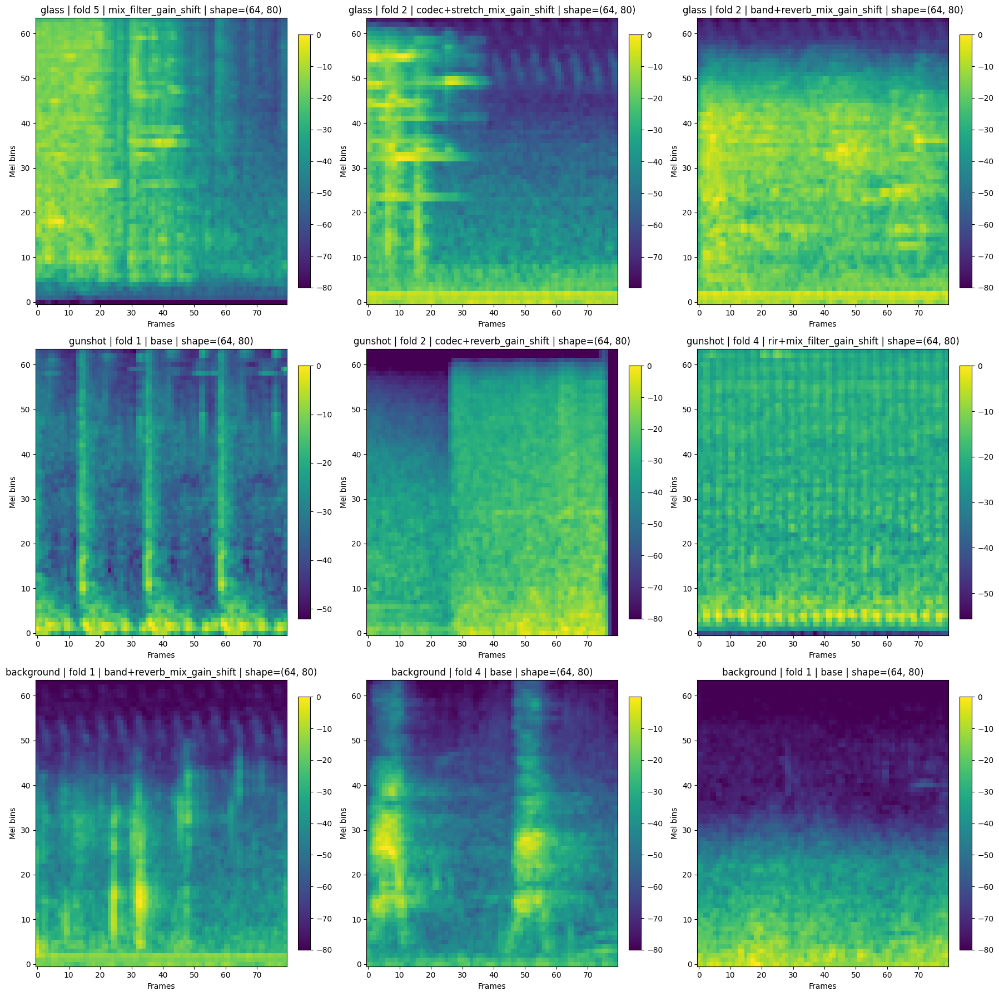

In [24]:
samples_per_label = 3
labels = ['glass', 'gunshot', BACKGROUND_LABEL]
rows = []
rng = np.random.default_rng(SEED)

for lbl in labels:
    subset = all_windows_df[all_windows_df['target_label'] == lbl]
    if subset.empty:
        continue
    # 有放回抽样，确保凑够 samples_per_label
    picks = subset.sample(n=samples_per_label, replace=len(subset) < samples_per_label, random_state=None)
    rows.extend(picks.to_dict('records'))

if not rows:
    print("No samples available for plotting.")
else:
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()
    for idx, row in enumerate(rows[:9]):  # 防止不足 9 条
        y, sr = resolve_audio_from_row(row, sr=TARGET_SR)
        mel = log_mel_spectrogram(y, sr)
        if TARGET_FRAMES is not None:
            if mel.shape[1] > TARGET_FRAMES:
                mel = mel[:, :TARGET_FRAMES]
            elif mel.shape[1] < TARGET_FRAMES:
                pad = TARGET_FRAMES - mel.shape[1]
                mel = np.pad(mel, ((0, 0), (0, pad)), mode="constant")
        ax = axes[idx]
        im = ax.imshow(mel, origin='lower', aspect='auto')
        ax.set_title(
            f"{row.get('target_label','?')} | fold {row.get('fold_id','?')} | {row.get('pipeline','base')} | shape={mel.shape}"
        )
        ax.set_xlabel('Frames')
        ax.set_ylabel('Mel bins')
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # 处理空格子
    for j in range(len(rows), 9):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()


## 缓存训练 window 的 mel-log 图谱，以及输出训练目录

In [25]:
# Cache mel features + export training index (API)

cache_dir = CACHE_MEL64
index_csv = PROJECT_ROOT / 'cache' / 'window_index.csv'

index_df = cache_windows_to_mel_index(
    all_windows_df,
    cache_dir=cache_dir,
    index_csv=index_csv,
    target_sr=TARGET_SR,
    target_frames=TARGET_FRAMES,
)

print(f"Saved {len(index_df)} windows to {cache_dir}")
print(f"Index CSV: {index_csv}")
display(index_df.head())

# Quick sanity: label_ids combos (parse CSV-friendly strings)
import ast

def _to_tuple(v):
    if isinstance(v, str):
        try:
            v = ast.literal_eval(v)
        except Exception:
            return tuple()
    if v is None:
        return tuple()
    return tuple(v)

unique_combos = sorted({_to_tuple(v) for v in index_df['label_ids'].tolist()})
print('Unique label_ids combos:', unique_combos)
print('Label counts:')
print(index_df['label'].value_counts().to_string())


Saved 10000 windows to /workspace/cache/mel64
Index CSV: /workspace/cache/window_index.csv


,path,target_label,label,labels,label_ids,fold_id,pipeline,clip_id,window_id,source,shape,orig_label,length_sec
0,cache/mel64/glass/fold1/2-250710-A-39_2-250710...,glass,glass,[glass],[0],1,base,2-250710-A-39,2-250710-A-39_w0,esc50,"(64, 80)",glass,1.0
1,cache/mel64/glass/fold1/2-173559-A-39_2-173559...,glass,glass,[glass],[0],1,base,2-173559-A-39,2-173559-A-39_w0,esc50,"(64, 80)",glass,1.0
2,cache/mel64/glass/fold1/366595__jittels__glass...,glass,glass,[glass],[0],1,base,366595__jittels__glass-breaking,366595__jittels__glass-breaking_w0,freesound_glass_extra,"(64, 80)",glass,1.0
3,cache/mel64/glass/fold1/189575__unopiate__brea...,glass,glass,[glass],[0],1,base,189575__unopiate__breaking-glass,189575__unopiate__breaking-glass_w0,freesound_glass_extra,"(64, 80)",glass,1.0
4,cache/mel64/glass/fold1/4-204777-C-39_4-204777...,glass,glass,[glass],[0],1,base,4-204777-C-39,4-204777-C-39_w0,esc50,"(64, 80)",glass,1.0


Unique label_ids combos: [(), (0,), (1,)]
Label counts:
label
background    4000
glass         3000
gunshot       3000


In [26]:
# Cell: Export mel visualizations (per-fold & per-label sampling, excluding background)
viz_dir = PROJECT_ROOT / "cache" / "mel64_viz"
viz_dir.mkdir(parents=True, exist_ok=True)

# 采样比例：1.0=100%全量；0.2=20%
VIZ_SAMPLE_RATIO = 0.2 

if index_df is None or index_df.empty:
    print("index_df is empty; skip mel visualization")
else:
    viz_df = index_df[index_df["label"] != BACKGROUND_LABEL].copy()
    if viz_df.empty:
        print("No non-background samples for visualization")
    else:
        total_saved = 0
        total_groups = viz_df.groupby(["label", "fold_id"]).ngroups
        print(f"Groups to process: {total_groups}")

        for (label, fold_id), grp in viz_df.groupby(["label", "fold_id"]):
            if grp.empty:
                continue
            n = int(len(grp) * VIZ_SAMPLE_RATIO)
            if VIZ_SAMPLE_RATIO > 0 and n < 1:
                n = 1
            n = min(n, len(grp))
            sample = grp.sample(n=n, random_state=SEED)

            out_dir = viz_dir / str(label) / f"fold{fold_id}"
            out_dir.mkdir(parents=True, exist_ok=True)

            print(f"[{label} | fold {fold_id}] {len(grp)} rows -> saving {n} mels...")
            saved = 0
            for _, row in sample.iterrows():
                mel_path = Path(row["path"])
                if not mel_path.is_absolute():
                    mel_path = PROJECT_ROOT / mel_path
                mel = np.load(mel_path)

                out_path = out_dir / f"{mel_path.stem}.png"
                fig, ax = plt.subplots(figsize=(4, 3))
                im = ax.imshow(mel, origin="lower", aspect="auto")
                ax.set_title(f"{label} | fold {fold_id}")
                ax.set_xlabel("Frames")
                ax.set_ylabel("Mel bins")
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                fig.tight_layout()
                fig.savefig(out_path, dpi=120)
                plt.close(fig)
                saved += 1
                total_saved += 1

            print(f"  saved {saved} -> {out_dir}")

        print(f"Mel visualizations saved: {total_saved} images under {viz_dir}")


Groups to process: 10
[glass | fold 1] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/glass/fold1
[glass | fold 2] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/glass/fold2
[glass | fold 3] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/glass/fold3
[glass | fold 4] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/glass/fold4
[glass | fold 5] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/glass/fold5
[gunshot | fold 1] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/gunshot/fold1
[gunshot | fold 2] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/gunshot/fold2
[gunshot | fold 3] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/gunshot/fold3
[gunshot | fold 4] 600 rows -> saving 120 mels...
  saved 120 -> /workspace/cache/mel64_viz/gunshot/fold4
[gunshot | fold 5] 600 rows -> saving 120 me

## Regression Summary / 回归自检
这个单元不加载音频，只汇总关键表的规模/分布，方便每次改动后快速确认没有跑偏。


In [27]:
from collections import OrderedDict
import ast

def _maybe(name):
    return globals().get(name)

def _df_info(df, name):
    if df is None:
        return
    print(f"\n[{name}] rows={len(df)} cols={list(df.columns)}")

resampled_df = _maybe('resampled_df')
folded_df = _maybe('folded_df')
window_df = _maybe('window_df')
aug_df = _maybe('aug_df')
bg_df = _maybe('bg_df')
all_windows_df = _maybe('all_windows_df')
index_df = _maybe('index_df')

for name, df in [
    ('resampled_df', resampled_df),
    ('folded_df', folded_df),
    ('window_df', window_df),
    ('aug_df', aug_df),
    ('bg_df', bg_df),
    ('all_windows_df', all_windows_df),
    ('index_df', index_df),
]:
    _df_info(df, name)

if folded_df is not None and 'fold_id' in folded_df.columns and 'target_label' in folded_df.columns:
    print('\nFold x target_label (clip-level counts):')
    pivot = folded_df.pivot_table(index='target_label', columns='fold_id', values='filepath', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if all_windows_df is not None and 'fold_id' in all_windows_df.columns and 'target_label' in all_windows_df.columns:
    print('\nFold x target_label (window-level counts):')
    pivot = all_windows_df.pivot_table(index='target_label', columns='fold_id', values='window_id', aggfunc='count').fillna(0).astype(int)
    print(pivot.to_string())

if index_df is not None and 'path' in index_df.columns:
    # Inspect mel shape quickly by sampling one npy
    try:
        sample_path = Path(index_df['path'].iloc[0])
        if not sample_path.is_absolute():
            sample_path = PROJECT_ROOT / sample_path
        mel = np.load(sample_path)
        print(f"\nSample mel: {sample_path} shape={mel.shape} dtype={mel.dtype}")
    except Exception as e:
        print('\nSample mel check failed:', e)

    # label_ids combos
    if 'label_ids' in index_df.columns:
        def _parse_ids(v):
            if isinstance(v, str):
                try:
                    v = ast.literal_eval(v)
                except Exception:
                    return tuple()
            if v is None:
                return tuple()
            return tuple(v)
        combos = sorted({_parse_ids(v) for v in index_df['label_ids'].tolist()})
        print('\nUnique label_ids combos:', combos)



[resampled_df] rows=2369 cols=['sno', 'raw_filepath', 'filepath', 'label', 'canonical_label', 'source', 'fold_id', 'duration_sec', 'duration_samples', 'sr', 'channels', 'bit_depth', 'md5', 'extra_meta', 'target_label']

[folded_df] rows=2369 cols=['sno', 'raw_filepath', 'filepath', 'label', 'canonical_label', 'source', 'fold_id', 'duration_sec', 'duration_samples', 'sr', 'channels', 'bit_depth', 'md5', 'extra_meta', 'target_label']

[window_df] rows=10306 cols=['clip_id', 'window_id', 'fold_id', 'source', 'orig_label', 'target_label', 'start_sec', 'end_sec', 'length_sec', 'filepath', 'raw_filepath']

[aug_df] rows=6000 cols=['clip_id', 'window_id', 'fold_id', 'source', 'original_label', 'target_label', 'pipeline', 'device', 'copy', 'length_sec', 'audio', 'weapon']

[bg_df] rows=4000 cols=['clip_id', 'window_id', 'fold_id', 'source', 'original_label', 'target_label', 'pipeline', 'copy', 'length_sec', 'audio', 'filepath', 'raw_filepath', 'device']

[all_windows_df] rows=10000 cols=['cli